<a href="https://colab.research.google.com/github/hamza-masood/machinefailuresCatBoost/blob/main/Machine_Failures_CatBoost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
# !pip install optuna
# !pip install catboost # Installs the catboost package

import numpy as np # linear algebra
import pandas as pd # data processing
from pandas.api.types import is_numeric_dtype
import seaborn as sns
import matplotlib.pyplot as plt

import optuna # This import should now work
from optuna.samplers import TPESampler

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

# Models
from catboost import CatBoostClassifier, Pool # This import should now work
from catboost.utils import eval_metric


# Ignore warnings ;)
import warnings
warnings.simplefilter("ignore")

In [13]:
# files path
train_path     = "train.csv"
test_path      = "test.csv"
original_path  = "machine failure.csv"

# function to import our dataset
def import_data(train_path, test_path, original_path):
    train      =  pd.read_csv(train_path)
    test       =  pd.read_csv(test_path)
    original   =  pd.read_csv(original_path)

    return train, test, original

train, test, original = import_data(train_path, test_path, original_path)

In [14]:
train.head(3)

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0


In [15]:
original.head(3)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0


In [16]:
test.head(3)

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0


In [17]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
id,136429.0,68214.000000,39383.804275,0.0,34107.0,68214.0,102321.0,136428.0
Air temperature [K],136429.0,299.862776,1.862247,295.3,298.3,300.0,301.2,304.4
Process temperature [K],136429.0,309.941070,1.385173,305.8,308.7,310.0,310.9,313.8
Rotational speed [rpm],136429.0,1520.331110,138.736632,1181.0,1432.0,1493.0,1580.0,2886.0
Torque [Nm],136429.0,40.348643,8.502229,3.8,34.6,40.4,46.1,76.6
Tool wear [min],136429.0,104.408901,63.965040,0.0,48.0,106.0,159.0,253.0
Machine failure,136429.0,0.015744,0.124486,0.0,0.0,0.0,0.0,1.0
TWF,136429.0,0.001554,0.039389,0.0,0.0,0.0,0.0,1.0
HDF,136429.0,0.005160,0.071649,0.0,0.0,0.0,0.0,1.0
PWF,136429.0,0.002397,0.048899,0.0,0.0,0.0,0.0,1.0


In [18]:
original.describe().T

,count,mean,std,min,25%,50%,75%,max
UDI,10000.0,5000.50000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Air temperature [K],10000.0,300.00493,2.000259,295.3,298.30,300.1,301.50,304.5
Process temperature [K],10000.0,310.00556,1.483734,305.7,308.80,310.1,311.10,313.8
Rotational speed [rpm],10000.0,1538.77610,179.284096,1168.0,1423.00,1503.0,1612.00,2886.0
Torque [Nm],10000.0,39.98691,9.968934,3.8,33.20,40.1,46.80,76.6
Tool wear [min],10000.0,107.95100,63.654147,0.0,53.00,108.0,162.00,253.0
Machine failure,10000.0,0.03390,0.180981,0.0,0.00,0.0,0.00,1.0
TWF,10000.0,0.00460,0.067671,0.0,0.00,0.0,0.00,1.0
HDF,10000.0,0.01150,0.106625,0.0,0.00,0.0,0.00,1.0
PWF,10000.0,0.00950,0.097009,0.0,0.00,0.0,0.00,1.0


In [19]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
id,90954.0,181905.500000,26256.302529,136429.0,159167.25,181905.5,204643.75,227382.0
Air temperature [K],90954.0,299.859493,1.857562,295.3,298.30,300.0,301.20,304.4
Process temperature [K],90954.0,309.939375,1.385296,305.7,308.70,310.0,310.90,313.8
Rotational speed [rpm],90954.0,1520.528179,139.970419,1168.0,1432.00,1493.0,1579.00,2886.0
Torque [Nm],90954.0,40.335191,8.504683,3.8,34.60,40.5,46.20,76.6
Tool wear [min],90954.0,104.293962,63.871092,0.0,48.00,106.0,158.00,253.0
TWF,90954.0,0.001473,0.038355,0.0,0.00,0.0,0.00,1.0
HDF,90954.0,0.005343,0.072903,0.0,0.00,0.0,0.00,1.0
PWF,90954.0,0.002353,0.048449,0.0,0.00,0.0,0.00,1.0
OSF,90954.0,0.003870,0.062090,0.0,0.00,0.0,0.00,1.0


In [20]:
# List of numerical columns and categorical columns

numeric_cols = ['Air temperature [K]',
                'Process temperature [K]',
                'Rotational speed [rpm]',
                'Torque [Nm]',
                'Tool wear [min]']
binary_cols = [
                'TWF',
                'HDF',
                'PWF',
                'OSF',
                'RNF']

categ_cols   = train.select_dtypes(include=['object']).columns.tolist()
target       = 'Machine failure'
numeric_cols
#categ_cols

['Air temperature [K]',
 'Process temperature [K]',
 'Rotational speed [rpm]',
 'Torque [Nm]',
 'Tool wear [min]']

In [21]:
# fonction to calculate univariate stats like pandas describe method
def univariate_stats(df):
    #df.drop('id', axis=1, inplace=True)
    output_df = pd.DataFrame(columns=['Count', 'Missing', 'Unique', 'Dtype', 'IsNumeric', 'Mode', 'Mean', 'Min', '25%', 'Median', '75%', 'Max', 'Std', 'Skew', 'Kurt'])

    for col in df[numeric_cols + categ_cols]:
        if is_numeric_dtype(df[col]):
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype, is_numeric_dtype(df[col]), df[col].mode().values[0], df[col].mean(), df[col].min(), df[col].quantile(.25), df[col].median(), df[col].quantile(.75), df[col].max(), df[col].std(), df[col].skew(), df[col].kurt() ]
        else:
            output_df.loc[col] = [df[col].count(), df[col].isnull().sum(), df[col].nunique(), df[col].dtype, is_numeric_dtype(df[col]), df[col].mode().values[0], '-', '-', '-', '-', '-', '-', '-', '-', '-' ]

    return output_df.sort_values(by=['IsNumeric', 'Unique'], ascending=False)


pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [22]:
# Call the function on train
univariate_stats(train)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],136429,0,952,int64,True,1452.0,1520.33111,1181.0,1432.0,1493.0,1580.0,2886.0,138.736632,1.88825,8.183452
Torque [Nm],136429,0,611,float64,True,37.7,40.348643,3.8,34.6,40.4,46.1,76.6,8.502229,-0.028963,0.130166
Tool wear [min],136429,0,246,int64,True,0.0,104.408901,0.0,48.0,106.0,159.0,253.0,63.96504,-0.02731,-1.195126
Air temperature [K],136429,0,95,float64,True,300.7,299.862776,295.3,298.3,300.0,301.2,304.4,1.862247,0.161175,-0.781569
Process temperature [K],136429,0,81,float64,True,310.6,309.94107,305.8,308.7,310.0,310.9,313.8,1.385173,0.057088,-0.598883
Product ID,136429,0,9976,object,False,L53257,-,-,-,-,-,-,-,-,-
Type,136429,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [23]:
# Call the function to check univariate stats on the original dataset
univariate_stats(original)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],10000,0,941,int64,True,1452.0,1538.7761,1168.0,1423.0,1503.0,1612.0,2886.0,179.284096,1.993171,7.392945
Torque [Nm],10000,0,577,float64,True,40.2,39.98691,3.8,33.2,40.1,46.8,76.6,9.968934,-0.009517,-0.013241
Tool wear [min],10000,0,246,int64,True,0.0,107.951,0.0,53.0,108.0,162.0,253.0,63.654147,0.027292,-1.166737
Air temperature [K],10000,0,93,float64,True,300.7,300.00493,295.3,298.3,300.1,301.5,304.5,2.000259,0.114274,-0.835962
Process temperature [K],10000,0,82,float64,True,310.6,310.00556,305.7,308.8,310.1,311.1,313.8,1.483734,0.015027,-0.499734
Product ID,10000,0,10000,object,False,H29424,-,-,-,-,-,-,-,-,-
Type,10000,0,3,object,False,L,-,-,-,-,-,-,-,-,-


In [24]:
# Call the function to check univariate stats on test dataset
univariate_stats(test)

,Count,Missing,Unique,Dtype,IsNumeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Rotational speed [rpm],90954,0,946,int64,True,1452.0,1520.528179,1168.0,1432.0,1493.0,1579.0,2886.0,139.970419,1.947502,8.55058
Torque [Nm],90954,0,595,float64,True,37.7,40.335191,3.8,34.6,40.5,46.2,76.6,8.504683,-0.051562,0.124109
Tool wear [min],90954,0,246,int64,True,0.0,104.293962,0.0,48.0,106.0,158.0,253.0,63.871092,-0.019823,-1.191195
Air temperature [K],90954,0,92,float64,True,300.7,299.859493,295.3,298.3,300.0,301.2,304.4,1.857562,0.163401,-0.771786
Process temperature [K],90954,0,84,float64,True,310.6,309.939375,305.7,308.7,310.0,310.9,313.8,1.385296,0.049152,-0.597981
Product ID,90954,0,9909,object,False,L56257,-,-,-,-,-,-,-,-,-
Type,90954,0,3,object,False,L,-,-,-,-,-,-,-,-,-


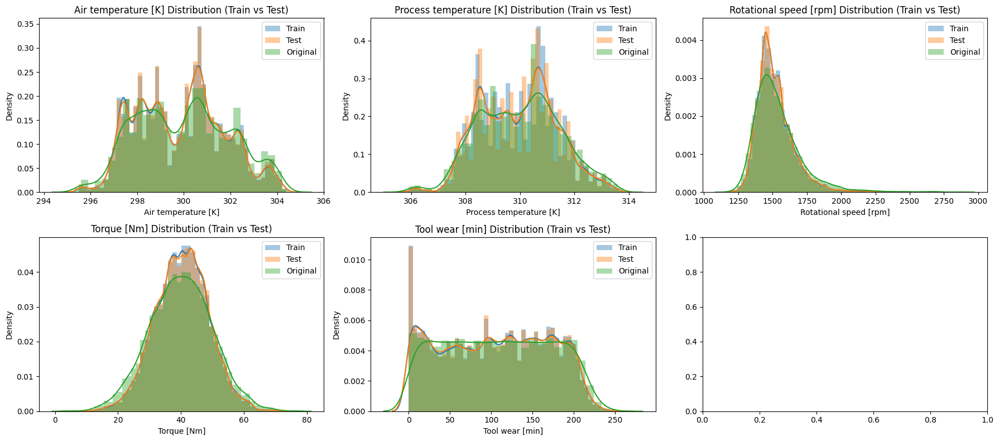

In [25]:
def plot_histograms(df_train, df_test, original, target, n_cols=3):
    n_rows = (len(df_train.columns) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))
    axes = axes.flatten()

    for i, var_name in enumerate(df_train.columns.tolist()):
        ax = axes[i]
        sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
        if var_name != target:
            sns.distplot(df_test[var_name], kde=True, ax=ax, label='Test')
        sns.distplot(original[var_name], kde=True, ax=ax, label='Original')
        ax.set_title(f'{var_name} Distribution (Train vs Test)')
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_histograms(train[numeric_cols], test[numeric_cols], original[numeric_cols], target, n_cols=3)


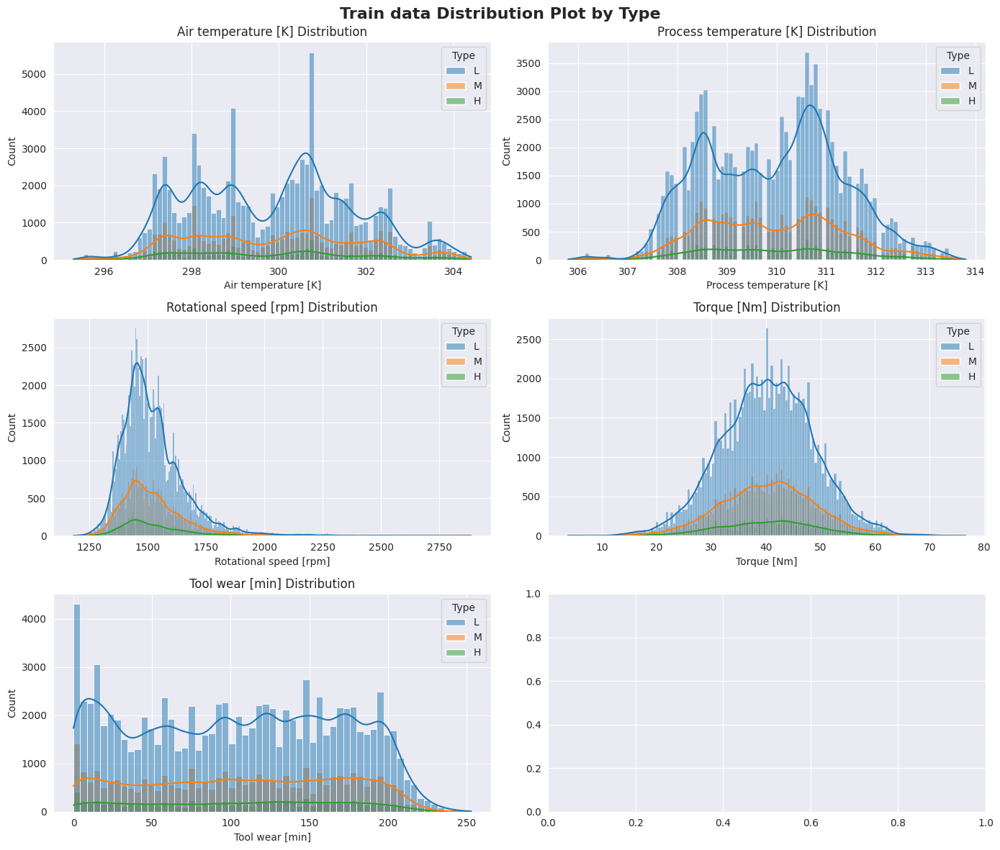

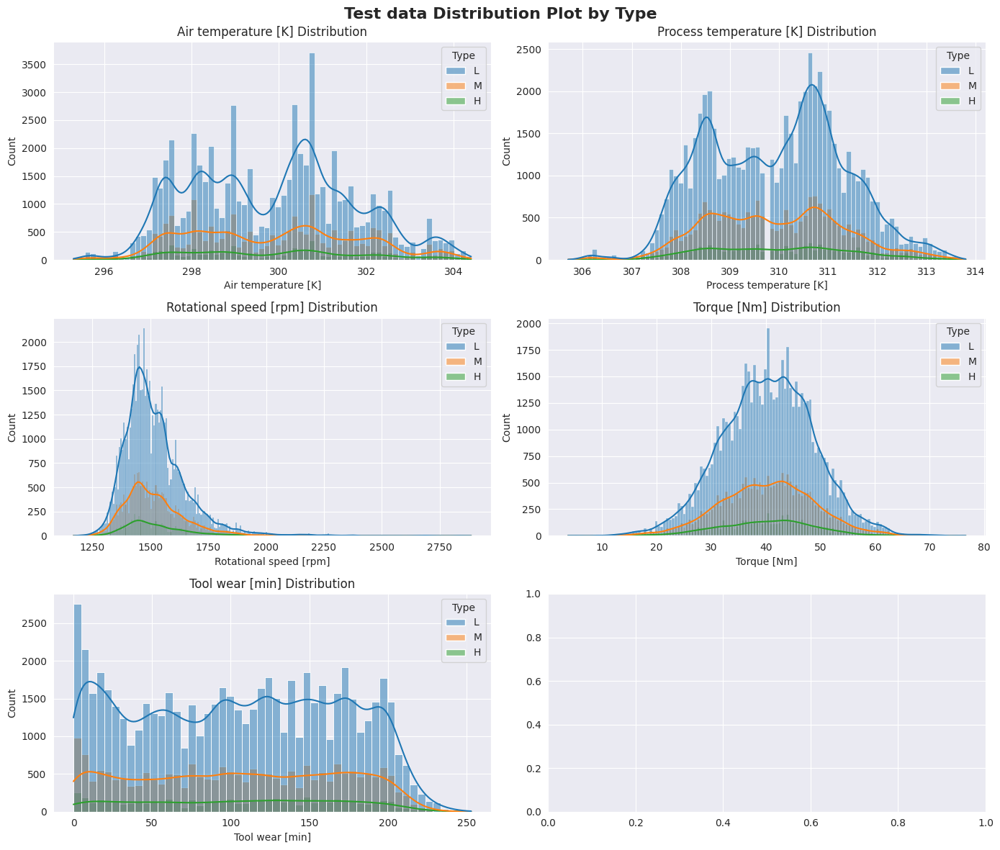

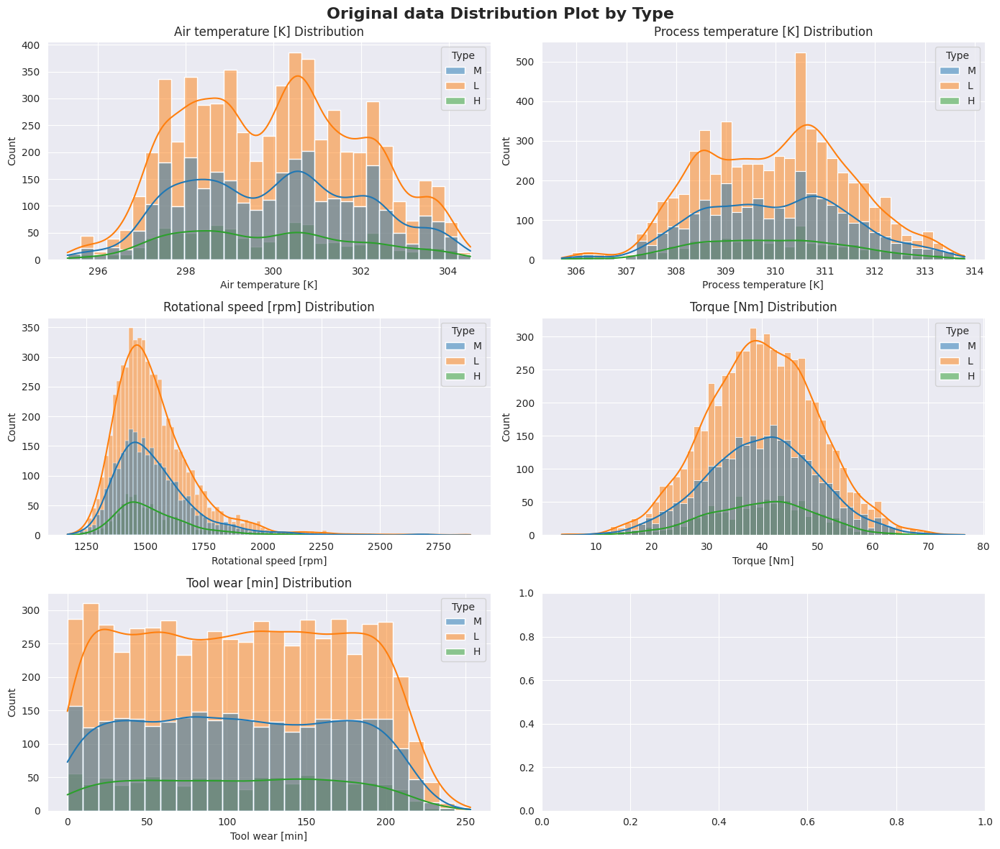

In [26]:
def plot_distribution(df, hue, title='', drop_cols=[]):
    sns.set_style('darkgrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_cols = 2
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.histplot(data=df, x=var_name, kde=True, ax=ax, hue=hue)
        # sns.distplot(df_train[var_name], kde=True, ax=ax, label='Train')
        ax.set_title(f'{var_name} Distribution')

    fig.suptitle(f'{title} Distribution Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_distribution(train[numeric_cols+['Type']], hue='Type', title='Train data')
plot_distribution(test[numeric_cols+['Type']], hue='Type', title='Test data')
plot_distribution(original[numeric_cols+['Type']], hue='Type', title='Original data')

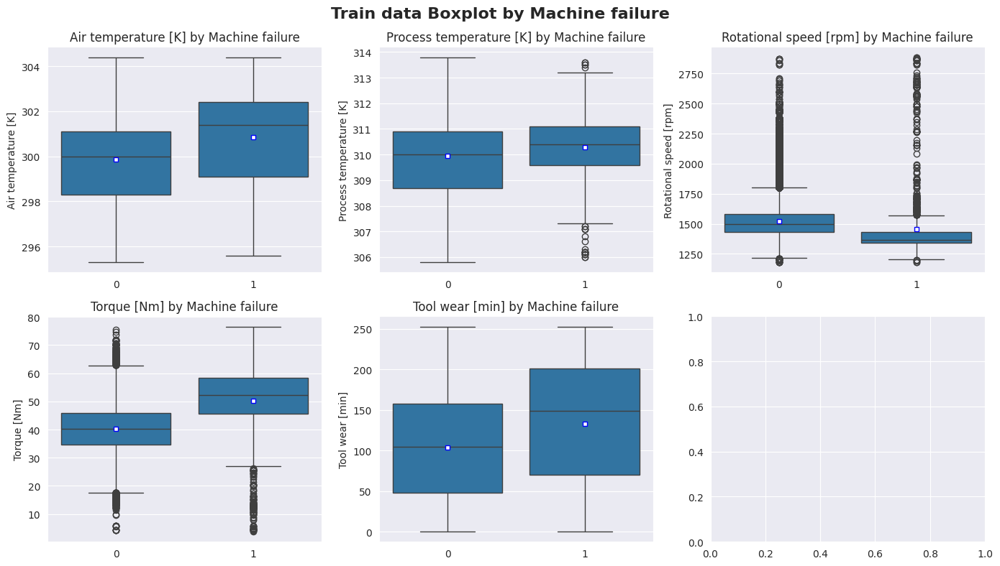

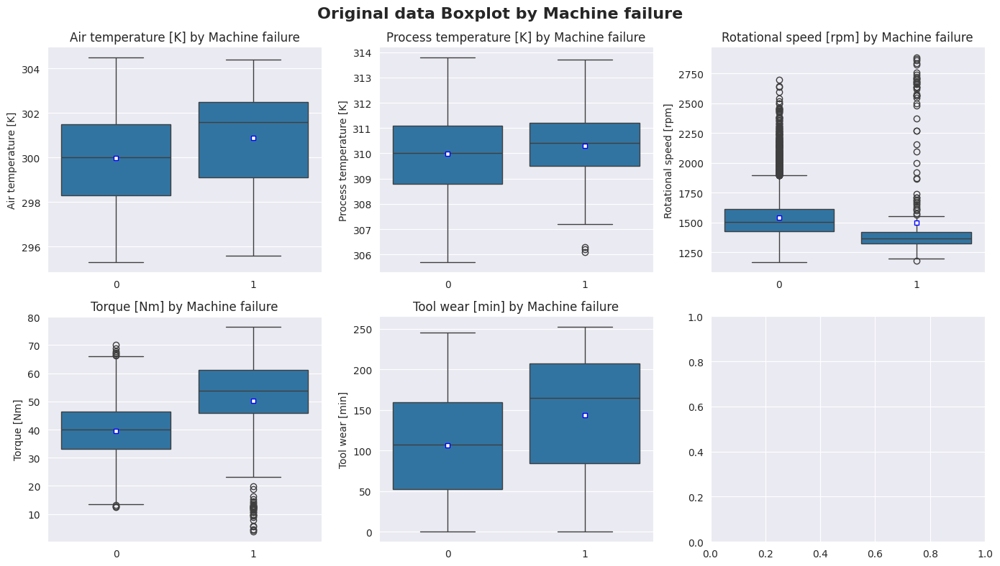

In [27]:
def plot_boxplot(df, hue, title='', drop_cols=[], n_cols=3):
    sns.set_style('darkgrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(14, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.boxplot(data=df, x=hue, y=var_name, ax=ax, showmeans=True,
                    meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue", "markersize":"5"})
        ax.set_title(f'{var_name} by {hue}')
        ax.set_xlabel('')

    fig.suptitle(f'{title} Boxplot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_boxplot(train[numeric_cols+[target]], hue=target, n_cols=3, title='Train data')
plot_boxplot(original[numeric_cols+[target]], hue=target, n_cols=3, title='Original data')

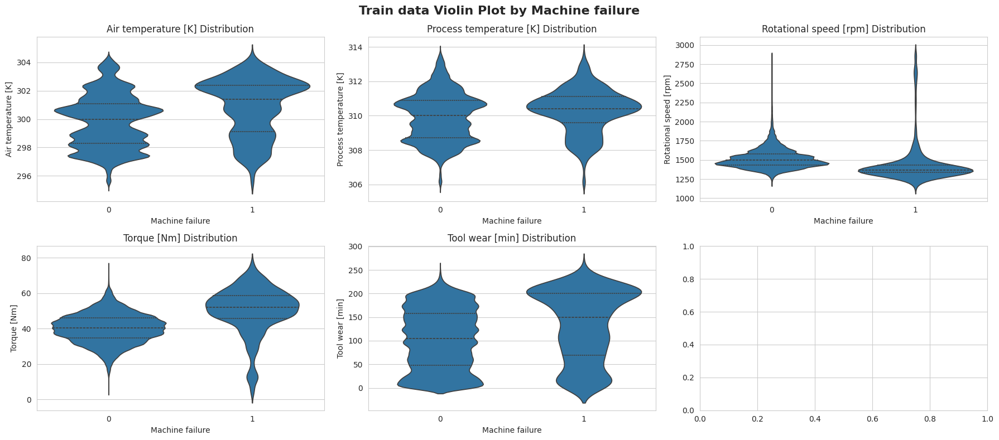

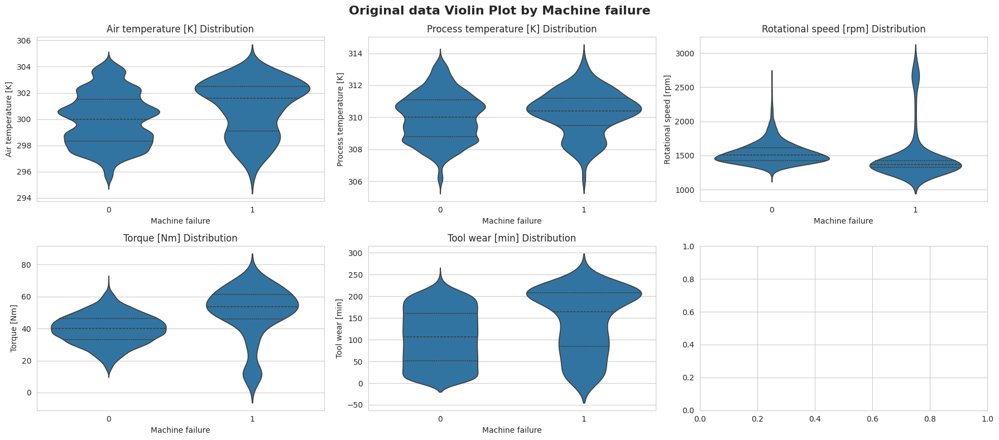

In [28]:
def plot_violinplot(df, hue, drop_cols=[], n_cols=2, title=''):
    sns.set_style('whitegrid')

    cols = df.columns.drop([hue] + drop_cols)
    n_rows = (len(cols) - 1) // n_cols + 1

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 4*n_rows))

    for i, var_name in enumerate(cols):
        row = i // n_cols
        col = i % n_cols

        ax = axes[row, col]
        sns.violinplot(data=df, x=hue, y=var_name, ax=ax, inner='quartile')
        ax.set_title(f'{var_name} Distribution')
        fig.suptitle(f'{title} Violin Plot by {hue}', fontweight='bold', fontsize=16)
    plt.tight_layout()
    plt.show()

plot_violinplot(train[numeric_cols+[target]], hue=target, n_cols=3, title='Train data')
plot_violinplot(original[numeric_cols+[target]], hue=target, n_cols=3, title='Original data')

In [29]:
#function to visualize the binary machine failures
def plot_binary_machine_failures(dataframe, column):
    # Plot the machine failures
    plt.figure(figsize=(10, 6))

    # Countplot for Machine failure
    ax = plt.subplot(1, 2, 1)
    ax = sns.countplot(x=column, data=dataframe)
    ax.bar_label(ax.containers[0])
    plt.title(column + " Failure", fontsize=20)

    # Pie chart for Outcome
    ax = plt.subplot(1, 2, 2)
    outcome_counts = dataframe[column].value_counts()
    ax = outcome_counts.plot.pie(explode=[0.1, 0.1], autopct='%1.2f%%', shadow=True)
    ax.set_title("Outcome", fontsize=20, color='Red', font='Lucida Calligraphy')

    # Display the plot
    plt.tight_layout()
    plt.show()

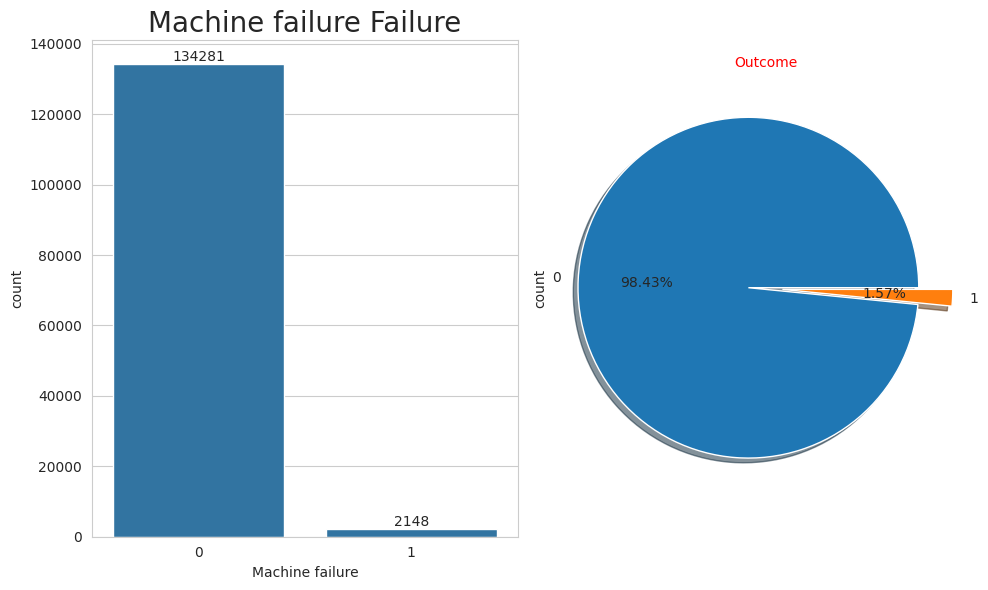

In [30]:
# Visualize the machine failure
plot_binary_machine_failures(train, 'Machine failure')

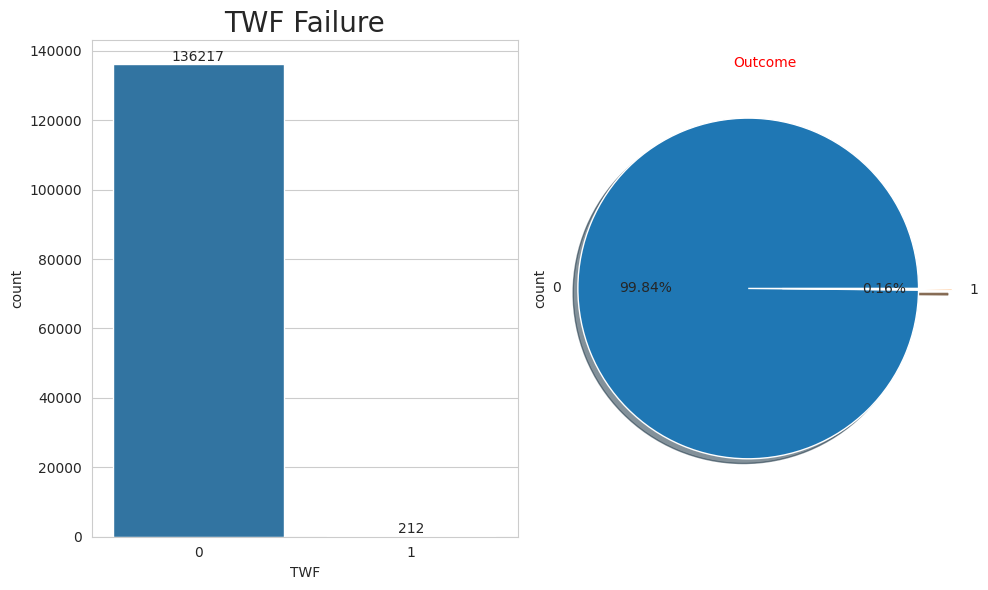

In [31]:
plot_binary_machine_failures(train, 'TWF')

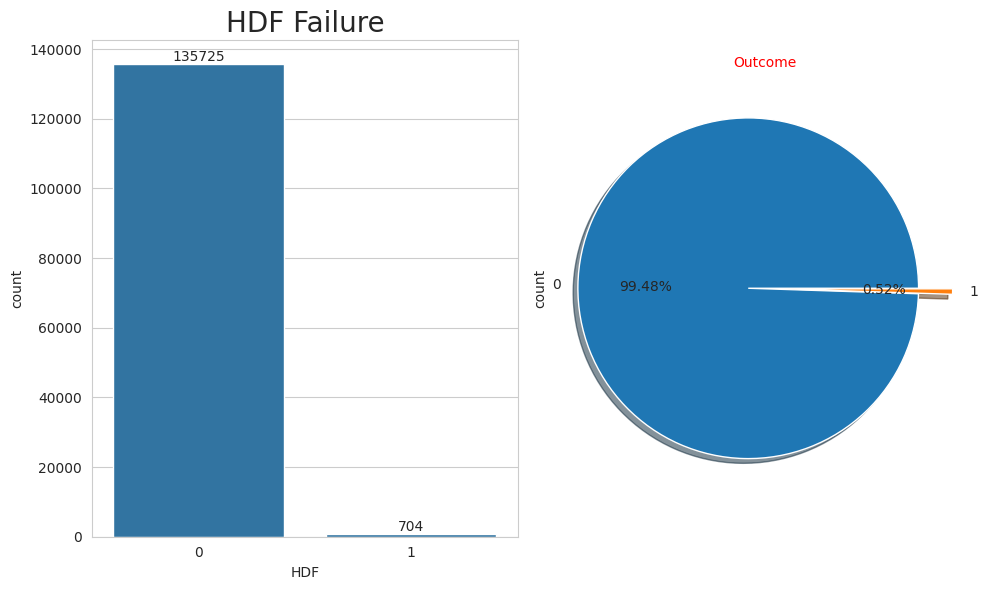

In [32]:
plot_binary_machine_failures(train, 'HDF')

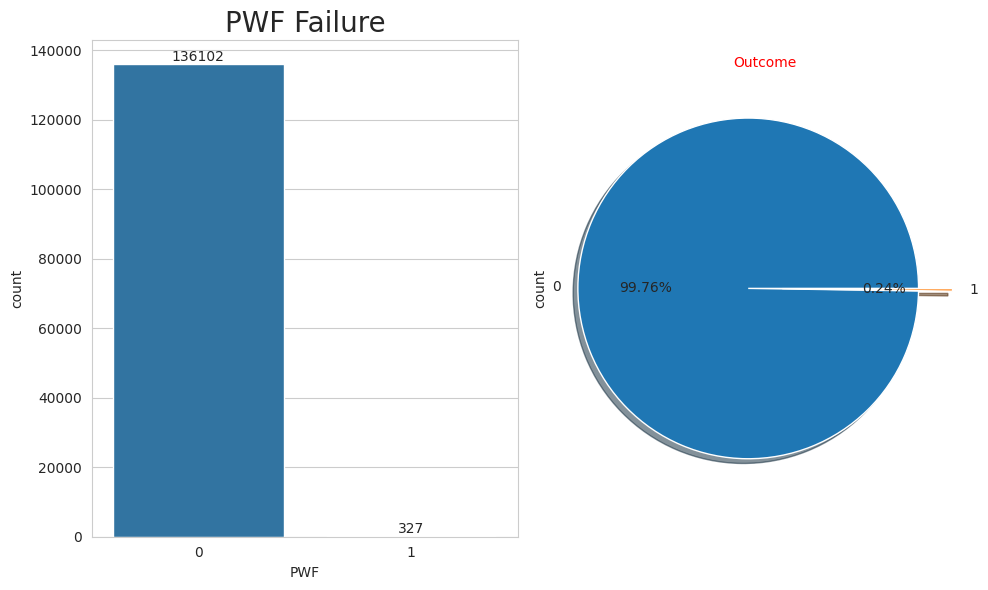

In [33]:
plot_binary_machine_failures(train, 'PWF')

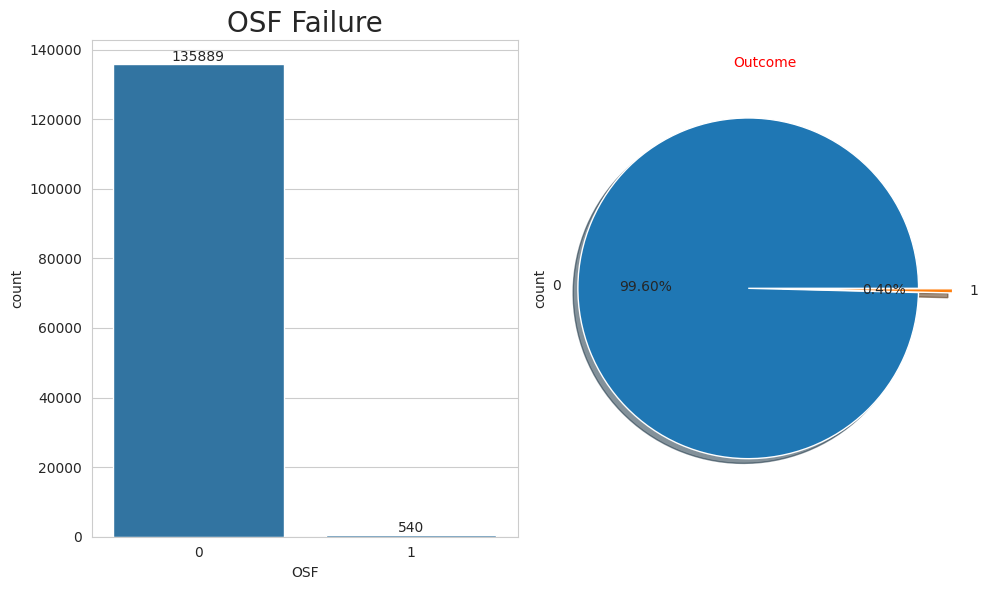

In [34]:
plot_binary_machine_failures(train, 'OSF')

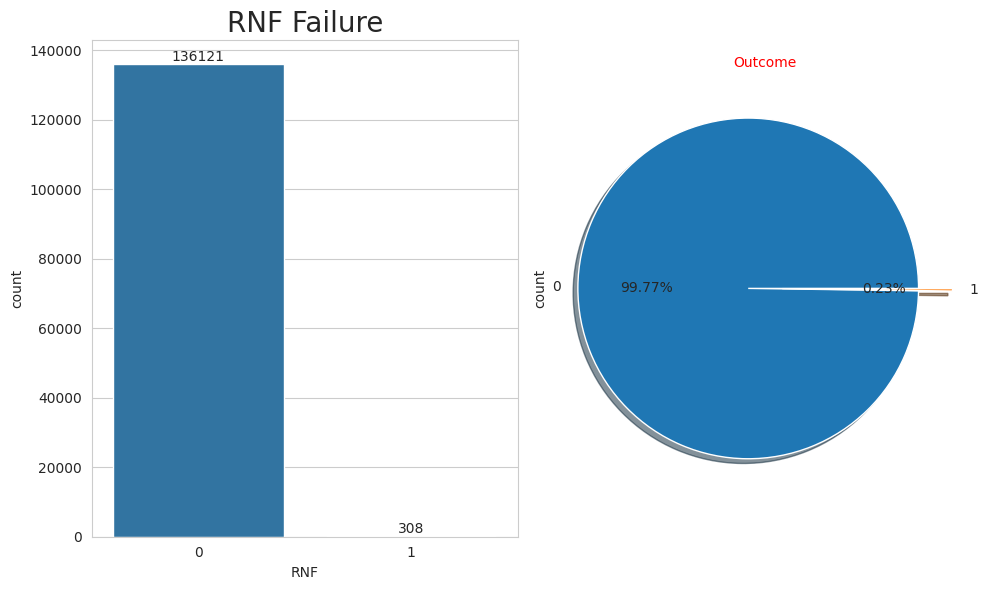

In [35]:
plot_binary_machine_failures(train, 'RNF')

In [36]:
# this just an intermediate function that will be used in bivstats for one-way ANOVA
def anova(df, feature, label):
    import pandas as pd
    import numpy as np
    from scipy import stats

    groups = df[feature].unique()
    df_grouped = df.groupby(feature)
    group_labels = []
    for g in groups:
        g_list = df_grouped.get_group(g)
        group_labels.append(g_list[label])

    return stats.f_oneway(*group_labels)

# function to calculate bivariate stats; Pearson' correlation, p-value and one-way ANOVA
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np

    # Create an empty DataFrame to store output
    output_df = pd.DataFrame(columns=['Stat', '+1/-1 * ', 'Effect size', 'p-value'])

    for col in df:
        if col != label:
            # Check for and handle inf and NaN before calculation
            # Only apply isfinite to numeric columns
            if df[col].isnull().sum() == 0 and (is_numeric_dtype(df[col]) and np.isfinite(df[col]).all()) and (is_numeric_dtype(df[label]) and np.isfinite(df[label]).all()):
                if is_numeric_dtype(df[col]):   # Calculate r and p
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = ['r', np.sign(r), abs(round(r, 3)), round(p,6)]

                else:
                    F, p = anova(df[[col, label]], col, label)
                    output_df.loc[col] = ['F', '', round(F, 3), round(p,6)]

            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, np.nan]

    return output_df.sort_values(by=['Effect size', 'Stat'], ascending=[False, False])

pd.options.display.float_format = '{:.5f}'.format
bivstats(train, target)

,Stat,+1/-1 *,Effect size,p-value
HDF,r,1.00000,0.56500,0.00000
OSF,r,1.00000,0.49500,0.00000
PWF,r,1.00000,0.38400,0.00000
TWF,r,1.00000,0.31200,0.00000
Torque [Nm],r,1.00000,0.14600,0.00000
Air temperature [K],r,1.00000,0.06800,0.00000
Rotational speed [rpm],r,-1.00000,0.06100,0.00000
Tool wear [min],r,1.00000,0.05600,0.00000
Process temperature [K],r,1.00000,0.03100,0.00000
id,r,1.00000,0.00100,0.57962


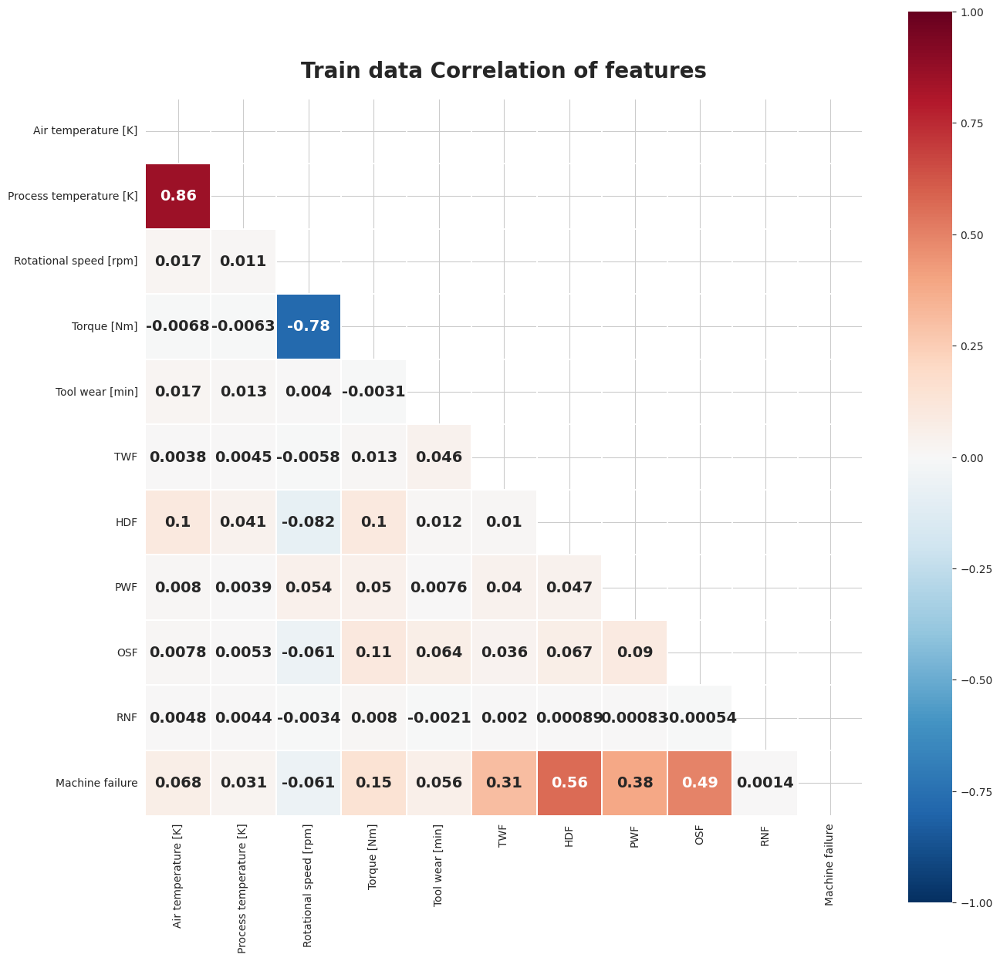

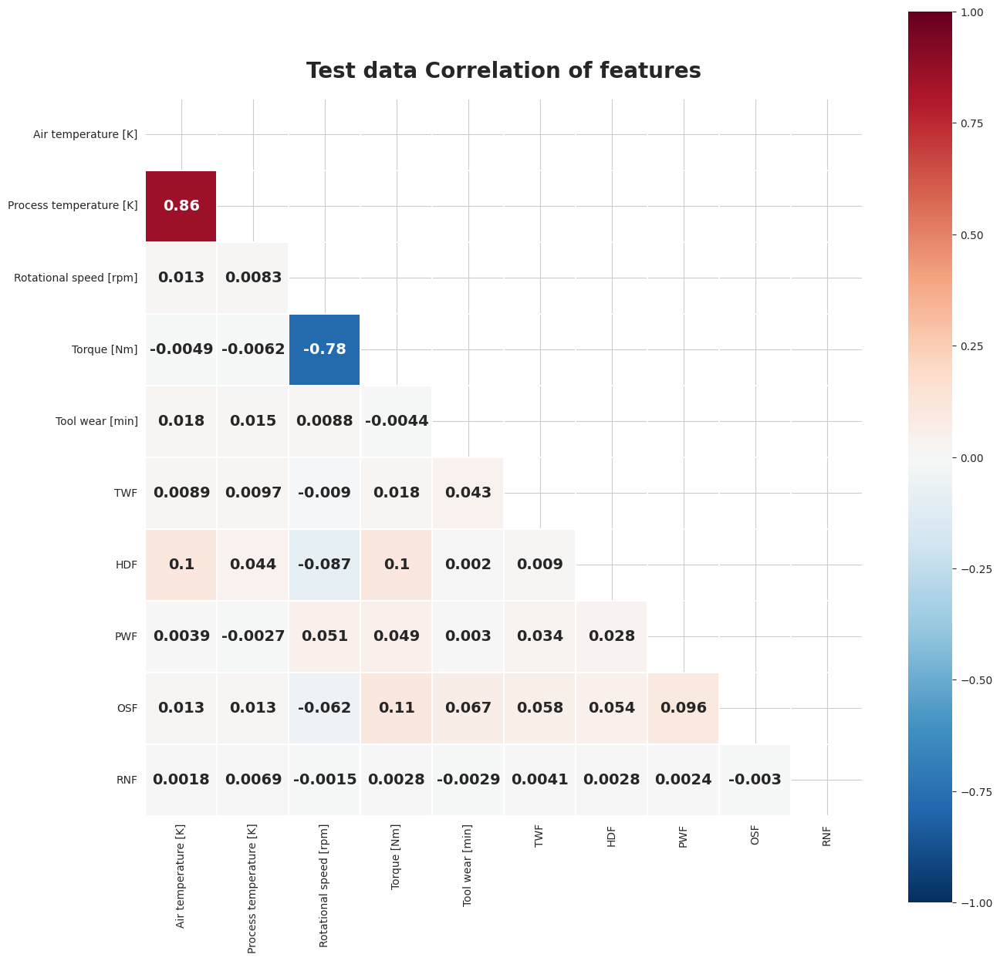

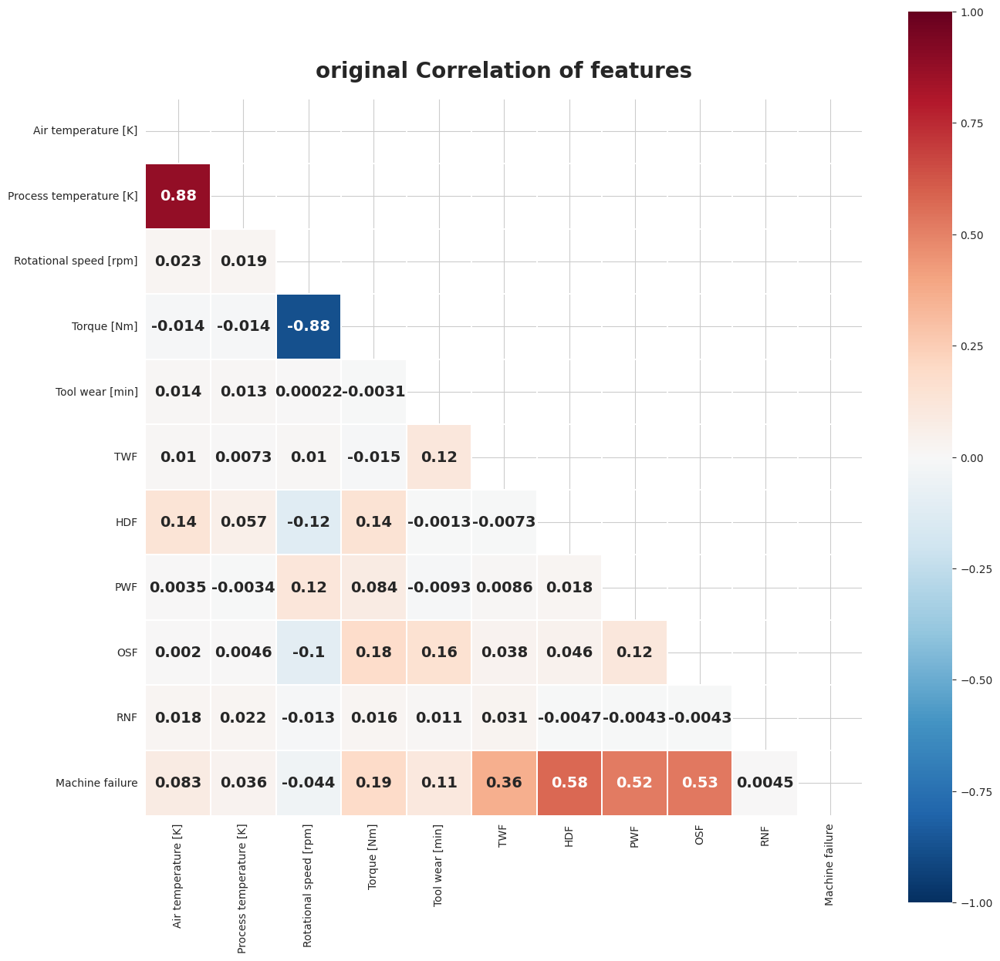

In [37]:
def plot_heatmap(df, title):
    # Create a mask for the diagonal elements
    mask = np.zeros_like(df.astype(float).corr())
    mask[np.triu_indices_from(mask)] = True

    # Set the colormap and figure size
    colormap = plt.cm.RdBu_r
    plt.figure(figsize=(15, 15))

    # Set the title and font properties
    plt.title(f'{title} Correlation of features', fontweight='bold', y=1.02, size=20)

    # Plot the heatmap with the masked diagonal elements
    sns.heatmap(df.astype(float).corr(), linewidths=0.1, vmax=1.0, vmin=-1.0,
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": 14, "weight": "bold"},
                mask=mask)

plot_heatmap(train[numeric_cols+binary_cols+[target]], title='Train data')
plot_heatmap(test[numeric_cols+binary_cols], title='Test data')
plot_heatmap(original[numeric_cols+binary_cols+[target]], title='original')

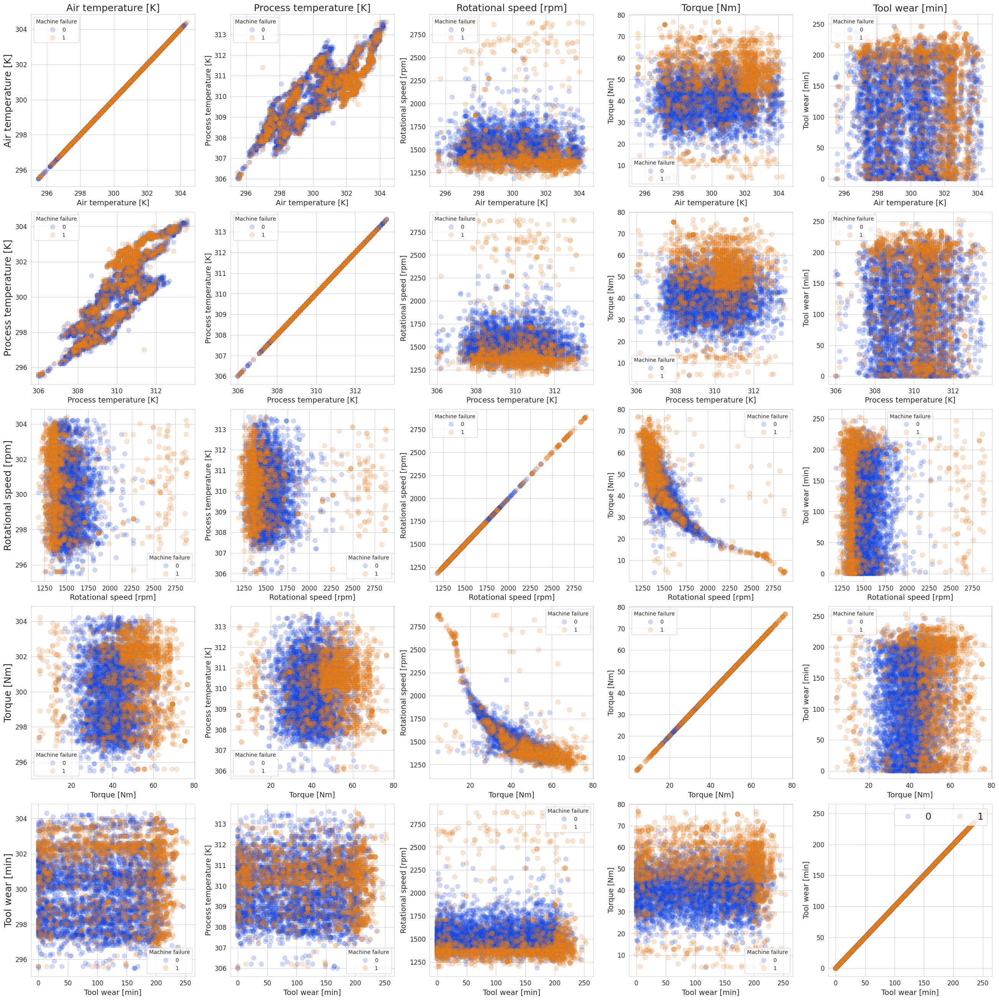

In [38]:
def plot_scatter_matrix(df, target_col, drop_cols=[], size=26):
    # sns.pairplot()

    sns.set_style('whitegrid')
    cols = df.columns.drop([target_col] + drop_cols)
    fig, axes = plt.subplots(len(cols), len(cols), figsize=(size, size), sharex=False, sharey=False)

    for i, col in enumerate(cols):
        for j, col_ in enumerate(cols):
            axes[i,j].set_xlabel(f'{col}', fontsize=14)
            axes[i,j].set_ylabel(f'{col_}', fontsize=14)

            # Plot the scatterplot
            sns.scatterplot(data=df, x=col, y=col_, hue=target_col, ax=axes[i,j],
                            s=80, edgecolor='gray', alpha=0.2, palette='bright')

            axes[i,j].tick_params(axis='both', which='major', labelsize=12)

            if i == 0:
                axes[i,j].set_title(f'{col_}', fontsize=18)
            if j == 0:
                axes[i,j].set_ylabel(f'{col}', fontsize=18)

    plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
    plt.legend(loc='upper right', ncol=5, fontsize=18)
    plt.show()

sampling_strategy = 0.5
rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
X_train_res, y_train_res = rus.fit_resample(train.drop(target, axis=1), train[target])
plot_scatter_matrix(pd.concat([X_train_res[numeric_cols], y_train_res], axis=1), target)

In [39]:
original_true_labels = original[original['Machine failure'] == 1].drop('UDI', axis=1)
print("Original Data Shape: ", original_true_labels.shape)

# concatenate datasets
df_all = pd.concat([train, original_true_labels], ignore_index=True)
df_all = df_all.drop_duplicates()
df_all

Original Data Shape:  (339, 13)


,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0.00000,L50096,L,300.60000,309.60000,1596,36.10000,140,0,0,0,0,0,0
1,1.00000,M20343,M,302.60000,312.10000,1759,29.10000,200,0,0,0,0,0,0
2,2.00000,L49454,L,299.30000,308.50000,1805,26.50000,25,0,0,0,0,0,0
3,3.00000,L53355,L,301.00000,310.90000,1524,44.30000,197,0,0,0,0,0,0
4,4.00000,M24050,M,298.00000,309.00000,1641,35.40000,34,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136763,NaN,L56938,L,298.60000,309.80000,2271,16.20000,218,1,1,0,0,0,0
136764,NaN,L56944,L,298.50000,309.50000,1294,66.70000,12,1,0,0,1,0,0
136765,NaN,L57002,L,298.50000,309.40000,1360,60.90000,187,1,0,0,0,1,0
136766,NaN,L57010,L,298.30000,309.30000,1337,56.10000,206,1,0,0,0,1,0


In [40]:
# function to add more features to the dataset
def feature_engineering(df):

    # Create interaction features
    df['Temperature_Torque_Interaction']   =     df['Process temperature [K]']   *     df['Torque [Nm]']
    df['Speed_Torque_Interaction']         =     df['Rotational speed [rpm]']    *     df['Torque [Nm]']
    df['Temperature_Speed_Interaction']    =     df['Process temperature [K]']   *     df['Rotational speed [rpm]']
    df['Sum_Binary_features']              =     df['TWF'] + df['HDF'] + df['PWF'] + df['OSF'] + df['RNF']

    # Create time-based features
    df['Tool_Usage_Duration']              =     df.groupby('Product ID')['Tool wear [min]'].transform(lambda x: x.max() - x.min())
    df['Average_Temperature']              =     df.groupby('Product ID')['Process temperature [K]'].transform('mean')
    df['Maximum_Torque']                   =     df.groupby('Product ID')['Torque [Nm]'].transform('max')


    news_cols = ['Temperature_Torque_Interaction', 'Speed_Torque_Interaction', 'Temperature_Speed_Interaction', 'Sum_Binary_features',
                 'Tool_Usage_Duration', 'Average_Temperature', 'Maximum_Torque']

    return df, news_cols

In [41]:
# adding features
train_eng, news_cols   = feature_engineering(df_all)
test_eng, news_cols    = feature_engineering(test)

# updating numeric_cols
numeric_cols = numeric_cols + news_cols
numeric_cols

train_eng.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,0.00000,L50096,L,300.60000,309.60000,1596,36.10000,140,0,0,0,0,0,0,11176.56000,57615.60000,494121.60000,0,172,309.54800,50.20000
1,1.00000,M20343,M,302.60000,312.10000,1759,29.10000,200,0,0,0,0,0,0,9082.11000,51186.90000,548983.90000,0,200,312.17000,54.60000
2,2.00000,L49454,L,299.30000,308.50000,1805,26.50000,25,0,0,0,0,0,0,8175.25000,47832.50000,556842.50000,0,173,308.59697,54.30000
3,3.00000,L53355,L,301.00000,310.90000,1524,44.30000,197,0,0,0,0,0,0,13772.87000,67513.20000,473811.60000,0,197,310.83793,59.70000
4,4.00000,M24050,M,298.00000,309.00000,1641,35.40000,34,0,0,0,0,0,0,10938.60000,58091.40000,507069.00000,0,91,308.98750,49.10000


In [42]:
# Prepare our dataset

train_eng.drop(columns=["id", "PWF", "HDF", "TWF", "OSF"], inplace=True, axis=1)

test_id = test_eng["id"]      # keeping this for submission
test_eng.drop(columns= ["id", "PWF", "HDF", "TWF", "OSF"], inplace=True, axis=1)
test_eng.head(3)

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,L50896,L,302.30000,311.50000,1499,38.00000,60,0,11837.00000,56962.00000,466938.50000,0,183,311.31667,47.20000
1,L53866,L,301.70000,311.00000,1713,28.80000,17,0,8956.80000,49334.40000,532743.00000,0,174,310.92667,48.70000
2,L50498,L,301.30000,310.40000,1525,37.70000,96,0,11702.08000,57492.50000,473360.00000,0,153,310.42857,53.60000


In [43]:
"""#scaling the data
scaler = StandardScaler()

X[numeric_cols]        = pd.DataFrame(scaler.fit_transform(X[numeric_cols]))
test_eng[numeric_cols] = pd.DataFrame(scaler.transform(test_eng[numeric_cols]))
test_eng"""

'#scaling the data\nscaler = StandardScaler()\n\nX[numeric_cols]        = pd.DataFrame(scaler.fit_transform(X[numeric_cols]))\ntest_eng[numeric_cols] = pd.DataFrame(scaler.transform(test_eng[numeric_cols]))\ntest_eng'

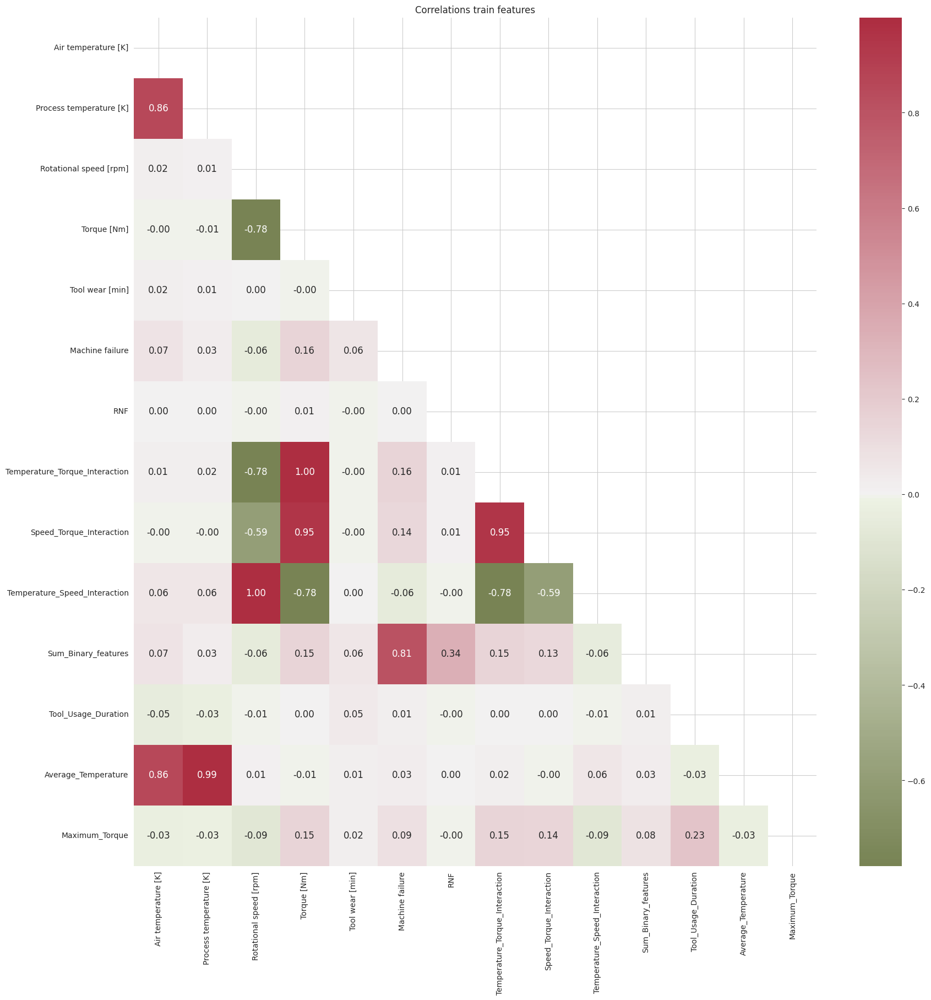

In [44]:
#plot_heatmap(train_eng[numeric_cols + news_cols + [target]], title='Train_eng data')

# Select only numeric columns for correlation calculation
corr_mat_data = train_eng.select_dtypes(include=np.number).corr()

data_mask = np.triu(np.ones_like(corr_mat_data, dtype = bool))
cmap = sns.diverging_palette(100, 7, s = 75, l = 40, n = 20, center = 'light', as_cmap = True)

#fig, axes = plt.subplots(1, 1, figsize = (25, 10))
plt.figure(figsize=(20, 20))
sns.heatmap(corr_mat_data, annot = True, cmap = cmap, fmt = '.2f', center = 0,
            annot_kws = {'size': 12}, mask = data_mask).set_title('Correlations train features');

In [45]:
X  = train_eng.drop(columns=['Machine failure'], axis=1)
y  = train_eng['Machine failure']
y.head(3)

,Machine failure
0,0
1,0
2,0


In [46]:
X.head(3)

,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],RNF,Temperature_Torque_Interaction,Speed_Torque_Interaction,Temperature_Speed_Interaction,Sum_Binary_features,Tool_Usage_Duration,Average_Temperature,Maximum_Torque
0,L50096,L,300.60000,309.60000,1596,36.10000,140,0,11176.56000,57615.60000,494121.60000,0,172,309.54800,50.20000
1,M20343,M,302.60000,312.10000,1759,29.10000,200,0,9082.11000,51186.90000,548983.90000,0,200,312.17000,54.60000
2,L49454,L,299.30000,308.50000,1805,26.50000,25,0,8175.25000,47832.50000,556842.50000,0,173,308.59697,54.30000


In [47]:
"""smote = SMOTE(random_state=42)
X_resampled[numeric_cols], y_resampled = smote.fit_resample(X[numeric_cols], y)"""

'smote = SMOTE(random_state=42)\nX_resampled[numeric_cols], y_resampled = smote.fit_resample(X[numeric_cols], y)'

In [48]:
"""# Check the class distribution before and after applying SMOTE
print("Before SMOTE:")
print(y.value_counts())


print("After SMOTE:")
print(y_resampled.value_counts())"""

'# Check the class distribution before and after applying SMOTE\nprint("Before SMOTE:")\nprint(y.value_counts())\n\n\nprint("After SMOTE:")\nprint(y_resampled.value_counts())'

In [49]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
features_names_list = X_train.columns.tolist()
features_names_list

train_pool    = Pool(X_train.to_numpy(), y_train.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
val_pool      = Pool(X_val.to_numpy(), y_val.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

test_pool     = Pool(test.to_numpy(),                        feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

X_pool        = Pool(X.to_numpy(), y.to_numpy(),             feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

In [50]:

model = CatBoostClassifier(learning_rate=0.1, iterations=500, random_seed=42)
model.fit(X_train, y_train,
          cat_features=[0, 1],
          eval_set=(X_val, y_val),
          verbose=False,
          plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [51]:
print("Train AUC :", roc_auc_score(y_val, model.predict_proba(X_val)[:,1]))

Train AUC : 0.9810763759588887


In [52]:
predictions = model.predict_proba(test_eng)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure':predictions}
).to_csv(
    'CatBoost_base_submission.csv', index=False
)

In [53]:
params ={'loss_function': 'Logloss',
         'eval_metric': 'AUC',
         'random_seed': 42,
         'learning_rate': 0.027,
          'iterations': 927,
          'depth': 5,
          'subsample': 0.705
        }

earlystop_params = params.copy()
earlystop_params.update({
    'od_type': 'Iter',
    'od_wait': 60
})

model2 = CatBoostClassifier(**earlystop_params)
model2.fit(train_pool, eval_set=val_pool, verbose=50, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.9297585	best: 0.9297585 (0)	total: 104ms	remaining: 1m 36s
50:	test: 0.9607312	best: 0.9608583 (49)	total: 4.24s	remaining: 1m 12s
100:	test: 0.9789214	best: 0.9789319 (97)	total: 9.95s	remaining: 1m 21s
150:	test: 0.9813498	best: 0.9813498 (150)	total: 13.9s	remaining: 1m 11s
200:	test: 0.9815244	best: 0.9815403 (163)	total: 18.4s	remaining: 1m 6s
250:	test: 0.9815577	best: 0.9815985 (229)	total: 24s	remaining: 1m 4s
Stopped by overfitting detector  (60 iterations wait)

bestTest = 0.9815984583
bestIteration = 229

Shrink model to first 230 iterations.


In [54]:
print("Train AUC :", roc_auc_score(y_val, model2.predict_proba(X_val)[:,1]))

Train AUC : 0.9815984583302302


In [55]:
feature_importances = model2.get_feature_importance(train_pool)
feature_names = X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    print('{}: {}'.format(name, score))

Sum_Binary_features: 42.9123194702695
Product ID: 11.172885249852
Rotational speed [rpm]: 7.598090256959959
Temperature_Speed_Interaction: 5.632089080066147
RNF: 5.18241323435547
Torque [Nm]: 4.8581415002923185
Tool wear [min]: 4.774063431747003
Speed_Torque_Interaction: 4.603237063077956
Temperature_Torque_Interaction: 3.830138819874582
Air temperature [K]: 3.143623999763418
Maximum_Torque: 2.3676594303686005
Tool_Usage_Duration: 2.1124184597225923
Process temperature [K]: 0.727782993516574
Average_Temperature: 0.6879337028963467
Type: 0.39720330723753317


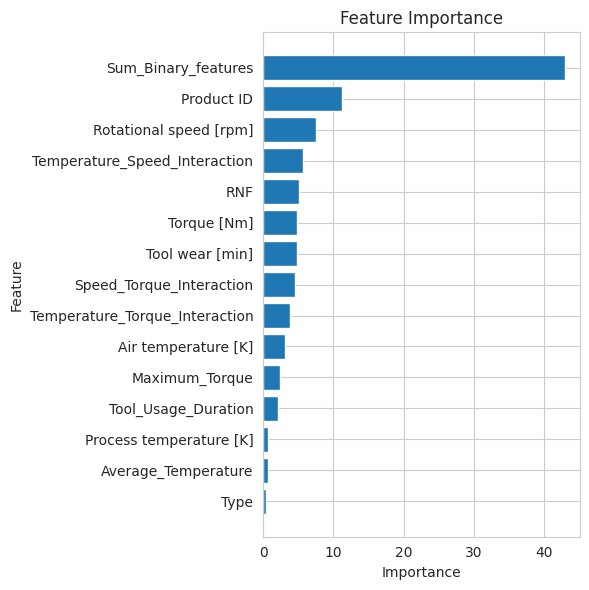

In [56]:
# Create a dataframe with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})

# Sort the dataframe by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)  # Sort in ascending order

# Create a vertical bar plot of feature importance
plt.figure(figsize=(6, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

In [57]:
predictions2 = model2.predict_proba(test_pool)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure':predictions2}
).to_csv(
    'CatBoost_submission_base2.csv', index=False
)


In [58]:
predictions3 = []

for i in range(10):
    clf = CatBoostClassifier(**earlystop_params, logging_level='Silent')
    clf.fit(train_pool, eval_set=val_pool)
    predictions3.append(clf.predict_proba(test_pool)[:,1])

predictions3

[array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848]),
 array([0.0011803 , 0.00121915, 0.00093844, ..., 0.00149925, 0.0096483 ,
        0.00124848])]

In [59]:
print("Train AUC :", roc_auc_score(y_val, clf.predict_proba(X_val)[:,1]))

Train AUC : 0.9815984583302302


In [60]:
prediction3 = np.mean(predictions3, axis=0)
pd.DataFrame(
    {'ID':test_id, 'Machine failure':prediction3}
).to_csv(
    'Bagging_CatBoost_submission.csv', index=False
)

In [61]:
# This function will calculate the quality of found hyperparameters on a test dataset:
def calculate_val_quality(train_pool=train_pool, val_pool=val_pool, **kwargs):
    model = CatBoostClassifier(**kwargs, random_seed=42)
    model.fit(train_pool, verbose=100, eval_set=val_pool)
    y_pred = model.predict_proba(val_pool)
    return eval_metric(val_pool.get_label(), y_pred[:, 1], 'AUC')

In [62]:
# Let's train a model with default parameters:
calculate_val_quality()

Learning rate set to 0.101056
0:	learn: 0.4447192	test: 0.4449461	best: 0.4449461 (0)	total: 93.5ms	remaining: 1m 33s
100:	learn: 0.0169450	test: 0.0186006	best: 0.0185689 (92)	total: 9.37s	remaining: 1m 23s
200:	learn: 0.0153991	test: 0.0185921	best: 0.0185233 (116)	total: 20.3s	remaining: 1m 20s
300:	learn: 0.0141679	test: 0.0188117	best: 0.0185233 (116)	total: 31s	remaining: 1m 12s
400:	learn: 0.0130285	test: 0.0190360	best: 0.0185233 (116)	total: 43.5s	remaining: 1m 4s
500:	learn: 0.0120744	test: 0.0193068	best: 0.0185233 (116)	total: 54.5s	remaining: 54.3s
600:	learn: 0.0112974	test: 0.0194520	best: 0.0185233 (116)	total: 1m 4s	remaining: 42.9s
700:	learn: 0.0106044	test: 0.0196363	best: 0.0185233 (116)	total: 1m 14s	remaining: 31.9s
800:	learn: 0.0100472	test: 0.0197545	best: 0.0185233 (116)	total: 1m 25s	remaining: 21.3s
900:	learn: 0.0094501	test: 0.0199813	best: 0.0185233 (116)	total: 1m 37s	remaining: 10.7s
999:	learn: 0.0088372	test: 0.0202032	best: 0.0185233 (116)	total: 1m

[0.9795241677217547]

In [63]:
"""cat_cv_scores  = list()

def objective(trial):
    params = {
        'eval_metric': 'AUC',
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3),
        'depth': trial.suggest_int('depth', 3, 15),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'boosting_type': 'Ordered',
        'max_ctr_complexity': trial.suggest_int('max_ctr_complexity', 0, 8),
        'iterations': trial.suggest_int('iterations', 300, 1000),
        'subsample': trial.suggest_float('subsample', 0.1, 0.9)
    }

    earlystop_params = params.copy()
    earlystop_params.update({
        'od_type': 'Iter',
        'od_wait': 60
    })

    skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

    for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):

        print("=======================================================================")

        X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
        y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]

        traino_pool    = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
        testo_pool      = Pool(X_testo.to_numpy(), y_testo.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])

        optuna_model = CatBoostClassifier(**earlystop_params, random_seed=42)
        optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)

        y_pred = optuna_model.predict_proba(testo_pool)
        cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')
        cat_cv_scores.append(cat_score_fold)

        print('Fold N°', i, '==> CatBoost       - AUC: ====>', cat_score_fold)

    return np.mean(cat_cv_scores)

sampler = TPESampler(seed=123)
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=15)"""

'cat_cv_scores  = list()\n\ndef objective(trial):\n    params = {\n        \'eval_metric\': \'AUC\',\n        \'learning_rate\': trial.suggest_float(\'learning_rate\', 0.001, 0.3),\n        \'depth\': trial.suggest_int(\'depth\', 3, 15),\n        \'l2_leaf_reg\': trial.suggest_float(\'l2_leaf_reg\', 1, 10),\n        \'boosting_type\': \'Ordered\',\n        \'max_ctr_complexity\': trial.suggest_int(\'max_ctr_complexity\', 0, 8),\n        \'iterations\': trial.suggest_int(\'iterations\', 300, 1000),\n        \'subsample\': trial.suggest_float(\'subsample\', 0.1, 0.9)\n    }\n    \n    earlystop_params = params.copy()\n    earlystop_params.update({\n        \'od_type\': \'Iter\',\n        \'od_wait\': 60\n    })\n    \n    skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)\n    \n    for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):\n        \n        print("=======================================================================")\n        \n        X_tra

In [64]:
# Best params obtained from Optuna

best_params = {'learning_rate': 0.15993386077870966,
                 'depth': 9,
                 'l2_leaf_reg': 6.70960862696189,
                 'max_ctr_complexity': 7,
                 'iterations': 807,
                 'subsample': 0.5888188085420664}

calculate_val_quality(**best_params)
best_params

0:	learn: 0.3338208	test: 0.3341413	best: 0.3341413 (0)	total: 189ms	remaining: 2m 32s
100:	learn: 0.0143354	test: 0.0187829	best: 0.0185913 (77)	total: 16.1s	remaining: 1m 52s
200:	learn: 0.0115933	test: 0.0192070	best: 0.0185913 (77)	total: 32.3s	remaining: 1m 37s
300:	learn: 0.0096969	test: 0.0196317	best: 0.0185913 (77)	total: 50.2s	remaining: 1m 24s
400:	learn: 0.0084545	test: 0.0198202	best: 0.0185913 (77)	total: 1m 6s	remaining: 1m 7s
500:	learn: 0.0073305	test: 0.0203236	best: 0.0185913 (77)	total: 1m 23s	remaining: 50.9s
600:	learn: 0.0064490	test: 0.0206554	best: 0.0185913 (77)	total: 1m 39s	remaining: 34.3s
700:	learn: 0.0056526	test: 0.0210311	best: 0.0185913 (77)	total: 1m 58s	remaining: 17.9s
800:	learn: 0.0050716	test: 0.0214901	best: 0.0185913 (77)	total: 2m 16s	remaining: 1.02s
806:	learn: 0.0050446	test: 0.0215074	best: 0.0185913 (77)	total: 2m 17s	remaining: 0us

bestTest = 0.01859126257
bestIteration = 77

Shrink model to first 78 iterations.


{'learning_rate': 0.15993386077870966,
 'depth': 9,
 'l2_leaf_reg': 6.70960862696189,
 'max_ctr_complexity': 7,
 'iterations': 807,
 'subsample': 0.5888188085420664}

In [65]:
best_cat_cv_scores, best_cat_preds = list(), list()
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

for i, (train_ix, test_ix) in enumerate(skf.split(X_train, y_train)):

    X_traino, X_testo = X_train.iloc[train_ix], X_train.iloc[test_ix]
    y_traino, y_testo = y_train.iloc[train_ix], y_train.iloc[test_ix]

    traino_pool     = Pool(X_traino.to_numpy(), y_traino.to_numpy(), feature_names = features_names_list, cat_features = ['Type', 'Product ID'])
    testo_pool      = Pool(X_testo.to_numpy(), y_testo.to_numpy(),     feature_names = features_names_list, cat_features = ['Type', 'Product ID'])


    best_optuna_model = CatBoostClassifier(**best_params, random_seed=42)
    best_optuna_model.fit(traino_pool, verbose=0, eval_set=testo_pool)

    y_pred = best_optuna_model.predict_proba(testo_pool)
    cat_score_fold = eval_metric(testo_pool.get_label(), y_pred[:, 1], 'AUC')
    best_cat_cv_scores.append(cat_score_fold)

    print('Fold N°', i, '==> CatBoost       -Best AUC: ====>', cat_score_fold)

print("Best score: =====>", np.mean(best_cat_cv_scores))

Fold N° 0 ==> CatBoost       -Best AUC: ====> [0.9827590855834659]
Fold N° 1 ==> CatBoost       -Best AUC: ====> [0.9815481160364279]
Fold N° 2 ==> CatBoost       -Best AUC: ====> [0.9700551278617897]
Fold N° 3 ==> CatBoost       -Best AUC: ====> [0.977962596318806]
Fold N° 4 ==> CatBoost       -Best AUC: ====> [0.983000558646446]
Best score: =====> 0.9790650968893871


Area under ROC curve: 0.9783905191032993


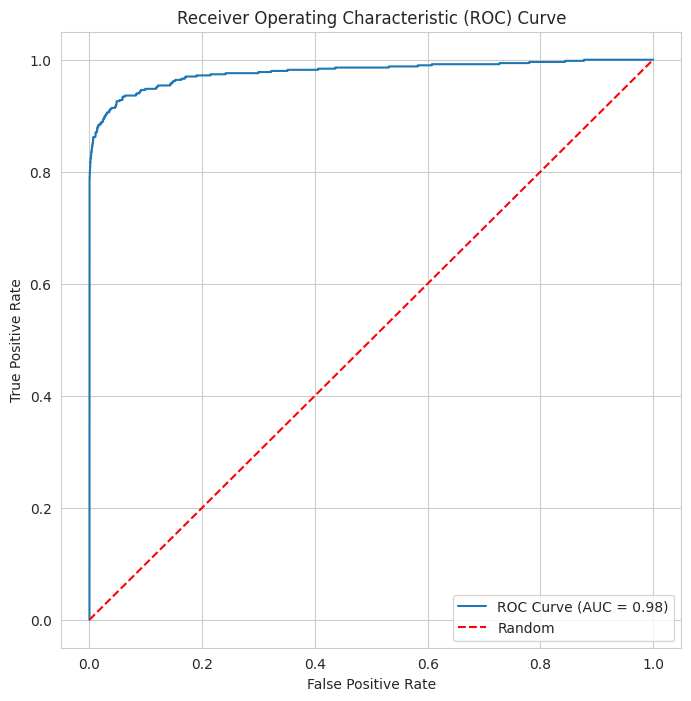

In [66]:
y_prob = best_optuna_model.predict_proba(X_val)[:, 1]
# Calculate the area under the ROC curve
roc_auc = roc_auc_score(y_val, y_prob)
print("Area under ROC curve:", roc_auc)

# Compute the false positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(y_val, y_prob)

# Plot the ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [67]:
best_optuna_predictions = best_optuna_model.predict_proba(test_eng)[:,1]
pd.DataFrame(
    {'ID':test_id, 'Machine failure': best_optuna_predictions}
).to_csv(
    'Best_Optuna_CatBoost_submission.csv', index=False
)